#**Naan Mudhalvan Capstone Project - GENERATIVE AI**
##**Image Colourization using GAN**


##**Install Libraries**

In [ ]:
import numpy as np
import h5py
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cv2
from keras.layers import Input,Dense,Reshape,Conv2D,Dropout,multiply,Dot,Concatenate,subtract,ZeroPadding2D
from keras.layers import BatchNormalization,LeakyReLU,Flatten
from keras.layers import Conv2DTranspose as Deconv2d
from keras.models import Model
from keras.optimizers import Adam
from tensorflow.keras.optimizers import Adam as legacy_Adam
import tensorflow as tf

from google.colab import files
from keras import backend as K
import smtplib

from sklearn.utils import shuffle
from google.colab import drive


##**Image Plot Function**

In [ ]:
def plot(A,B,C,n):
    samples = [A,B,C]
    fig = plt.figure(figsize=(3,n))
    gs = gridspec.GridSpec(3,n)
    g=0
    for i in range(3):
        for j in range(n):
            ax = plt.subplot(gs[g])
            g+=1
            plt.axis('off')
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_aspect('equal')
            if samples[i][j].shape == (32,32,1):
              plt.imshow(samples[i][j].reshape(32, 32))
            else:
              plt.imshow(samples[i][j].reshape(32,32,3))

    return fig

##**Mount Google Drive**

In [ ]:
drive.mount('/content/gdrive',force_remount=True)

Mounted at /content/gdrive


##**Import Cifar10 Dataset**

In [ ]:
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

y=x_train
x=np.sum(y, axis=3)/(3*255)

y_test=x_test
x_test=np.sum(x_test, axis=3)/(3*255)
x_test=x_test.reshape(10000, 32, 32, 1)

y=x_train/255
y=y*2-1

x=x.reshape(50000, 32, 32, 1)

print(x.shape)
print(y.shape)


(50000, 32, 32, 1)
(50000, 32, 32, 3)


##**Define Shape**

In [ ]:
x_shape=(32,32,1)
y_shape=(32,32,3)

##**Generator Function**

In [ ]:
def Generator():
  X = Input(shape = x_shape)

  C1 = Conv2D(64,kernel_size = 1, strides = 1,input_shape = x_shape)(X)
  C1 = LeakyReLU(0.2)(C1)

  C2 = Conv2D(128,kernel_size = 2, strides = 2)(C1)
  C2 = LeakyReLU(0.2)(C2)

  C3 = Conv2D(256,kernel_size = 2, strides = 2)(C2)
  C3 = LeakyReLU(0.2)(C3)

  C4 = Conv2D(512,kernel_size = 2, strides = 2)(C3)
  C4 = LeakyReLU(0.2)(C4)

  C5 = Conv2D(512, kernel_size = 2, strides = 2)(C4)
  C5 = LeakyReLU(0.2)(C5)

  DC0 = Deconv2d(512, kernel_size = 2, strides = 2)(C5)
  DC0 = LeakyReLU(0.2)(DC0)
  DC0 = BatchNormalization()(DC0)
  DC0 = Dropout(0.5)(DC0)
  DC0 = Concatenate(axis=3)([DC0, C4])

  DC1 = Deconv2d(256,kernel_size=2, strides = 2)(DC0)
  DC1 = LeakyReLU(0.2)(DC1)
  DC1 = BatchNormalization()(DC1)
  DC1 = Dropout(0.5)(DC1)
  DC1 = Concatenate(axis=3)([DC1,C3])

  DC2 = Deconv2d(128,kernel_size=2, strides = 2)(DC1)
  DC2 = LeakyReLU(0.2)(DC2)
  DC2 = BatchNormalization()(DC2)
  DC2 = Concatenate(axis=3)([DC2,C2])

  DC3 = Deconv2d(64,kernel_size=2, strides = 2)(DC2)
  DC3 = LeakyReLU(0.2)(DC3)
  DC3 = BatchNormalization()(DC3)
  DC3 = Concatenate(axis=3)([DC3,C1])

  CC4 = Conv2D(3,kernel_size=(1, 1), strides = (1, 1), activation="tanh")(DC3)

  m = Model(X,CC4)
  return m


##**Discriminator Function**

In [ ]:
def Discriminator():
  X = Input(shape = x_shape)
  Y = Input(shape = y_shape)

  In = Concatenate(axis=3)([X,Y])

  C1 = Conv2D(64,kernel_size = 2, strides = 2,input_shape = x_shape)(In)
  C1 = BatchNormalization()(C1)
  C1 = LeakyReLU(0.2)(C1)
  C2 = Conv2D(128,kernel_size = 2, strides = 2)(C1)
  C2 = BatchNormalization()(C2)
  C2 = LeakyReLU(0.2)(C2)

  C3 = Conv2D(256,kernel_size = 2, strides = 2)(C2)
  C3 = BatchNormalization()(C3)
  C3 = LeakyReLU(0.2)(C3)

  C4 = Conv2D(512,kernel_size = 1, strides = 1)(C3)
  C4 = BatchNormalization()(C4)
  C4 = LeakyReLU(0.2)(C4)

  D = Flatten()(C4)
  D = Dense(128)(D)
  D = Dense(1,activation='sigmoid')(D)

  m = Model([X,Y],D)
  return m



##**Train and Test Model**

In [ ]:
X = Input(shape = x_shape)
Y = Input(shape = y_shape)

gen = Generator()
dis = Discriminator()

out = gen(X)
comb = dis([X,out])

out = Flatten()(out)
org = Flatten()(Y)

cos_dis = Dot(axes = 1,normalize = True)([out,org])

combined = Model([X,Y],[comb,cos_dis])

print(combined)

In [ ]:
genLoss=[]
disLoss=[]

In [ ]:
epochs = 100
batch_size = 50
n_example = 5000
batches = int(n_example/batch_size)
dis_updates = 2
gen_updates = 1
zero=np.zeros((batch_size,1))
one=np.ones((batch_size,1))*0.9
d_loss_factor = batches*2*dis_updates
g_loss_factor = batches*gen_updates
reuse = False
adams = Adam(lr = 0.0001)

In [ ]:
if(reuse == True):
  gen.load_weights("gdrive/My Drive/newGAN/Generator.h5")
  dis.load_weights("gdrive/My Drive/newGAN/Discriminator.h5")

##############
For Epoch:0
Training Discriminator
2/2 [==============================] - 0s 6ms/step
Training Generator
Discriminator Loss:0.1637501115424243
Generator loss:0.3916277611255646
1/1 [==============================] - 0s 25ms/step


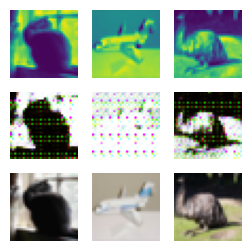

##############
For Epoch:1
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1628953109628651
Generator loss:0.41004254192113876
1/1 [==============================] - 0s 17ms/step


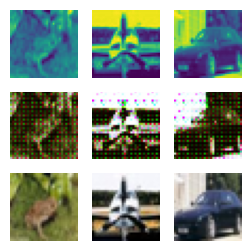

##############
For Epoch:2
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1682999226481843
Generator loss:0.461690419614315
1/1 [==============================] - 0s 20ms/step


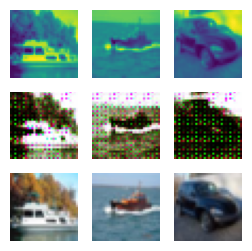

##############
For Epoch:3
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16259868213680306
Generator loss:0.3969335189461708
1/1 [==============================] - 0s 17ms/step


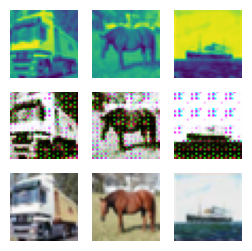

##############
For Epoch:4
Training Discriminator
2/2 [==============================] - 0s 10ms/step
Training Generator
Discriminator Loss:0.16267801749020577
Generator loss:0.40728964149951935
1/1 [==============================] - 0s 18ms/step


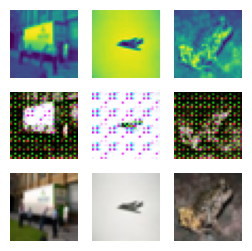

##############
For Epoch:5
Training Discriminator
2/2 [==============================] - 0s 13ms/step
Training Generator
Discriminator Loss:0.1626512610011173
Generator loss:0.3969034168124199
1/1 [==============================] - 0s 28ms/step


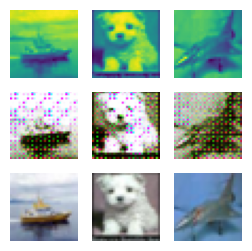

##############
For Epoch:6
Training Discriminator
2/2 [==============================] - 0s 10ms/step
Training Generator
Discriminator Loss:0.16269411771091655
Generator loss:0.39889223635196686
1/1 [==============================] - 0s 18ms/step


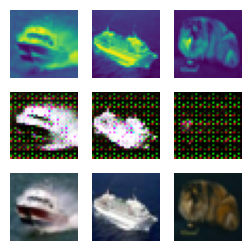

##############
For Epoch:7
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1626436766338236
Generator loss:0.3989423441886902
1/1 [==============================] - 0s 30ms/step


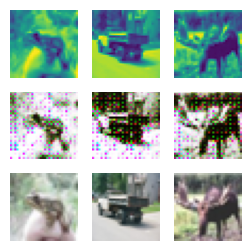

##############
For Epoch:8
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1626605477890587
Generator loss:0.39529056549072267
1/1 [==============================] - 0s 18ms/step


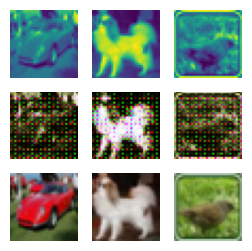

##############
For Epoch:9
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16263846100497062
Generator loss:0.3891053143143654
1/1 [==============================] - 0s 18ms/step


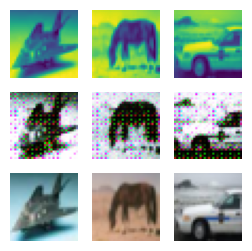

##############
For Epoch:10
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16258898861904414
Generator loss:0.38486179620027544
1/1 [==============================] - 0s 17ms/step


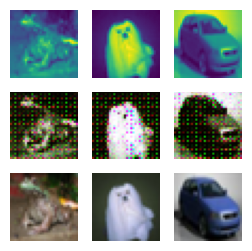

##############
For Epoch:11
Training Discriminator
2/2 [==============================] - 0s 7ms/step
Training Generator
Discriminator Loss:0.16262157085420767
Generator loss:0.3886798593401909
1/1 [==============================] - 0s 18ms/step


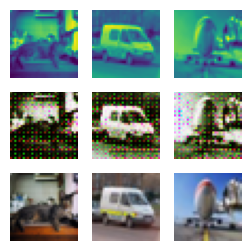

##############
For Epoch:12
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16260771122028758
Generator loss:0.3854880115389824
1/1 [==============================] - 0s 28ms/step


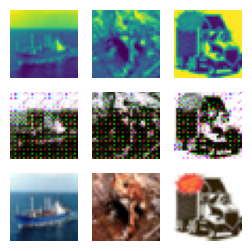

##############
For Epoch:13
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16263509748510557
Generator loss:0.3956793129444122
1/1 [==============================] - 0s 18ms/step


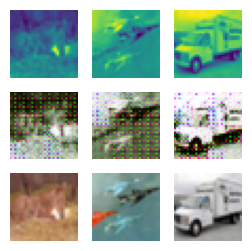

##############
For Epoch:14
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.18245040043398147
Generator loss:0.36037401169538497
1/1 [==============================] - 0s 18ms/step


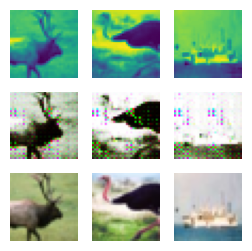

##############
For Epoch:15
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16270802037146723
Generator loss:0.3502420750260353
1/1 [==============================] - 0s 20ms/step


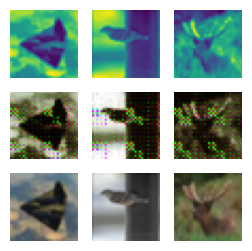

##############
For Epoch:16
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16265842561605354
Generator loss:0.35492994338274003
1/1 [==============================] - 0s 25ms/step


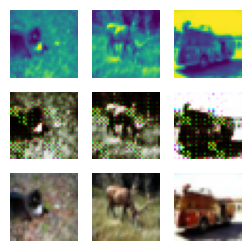

##############
For Epoch:17
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16262927392363394
Generator loss:0.3575327691435814
1/1 [==============================] - 0s 27ms/step


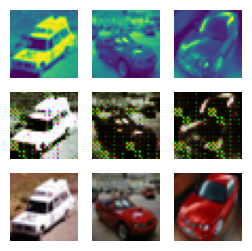

##############
For Epoch:18
Training Discriminator
2/2 [==============================] - 0s 13ms/step
Training Generator
Discriminator Loss:0.16269167795719341
Generator loss:0.35578311771154403
1/1 [==============================] - 0s 20ms/step


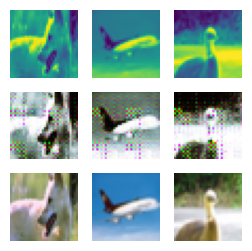

##############
For Epoch:19
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16259767897181177
Generator loss:0.35693161010742186
1/1 [==============================] - 0s 18ms/step


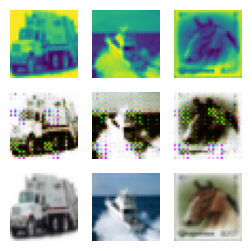

##############
For Epoch:20
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16264510781958508
Generator loss:0.3596964743733406
1/1 [==============================] - 0s 19ms/step


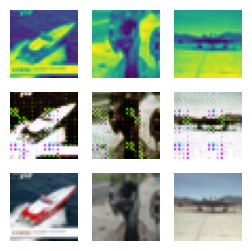

##############
For Epoch:21
Training Discriminator
2/2 [==============================] - 0s 9ms/step
Training Generator
Discriminator Loss:0.16260480906515512
Generator loss:0.3532063686847687
1/1 [==============================] - 0s 23ms/step


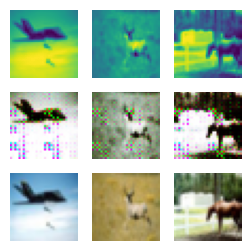

##############
For Epoch:22
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16266562154802727
Generator loss:0.35882862120866776
1/1 [==============================] - 0s 19ms/step


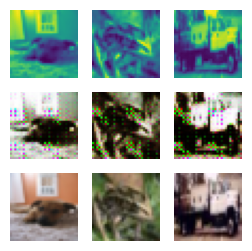

##############
For Epoch:23
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16268691349595998
Generator loss:0.3571144962310791
1/1 [==============================] - 0s 18ms/step


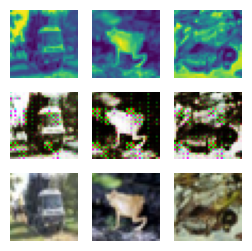

##############
For Epoch:24
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16266657386448288
Generator loss:0.36744711130857466
1/1 [==============================] - 0s 17ms/step


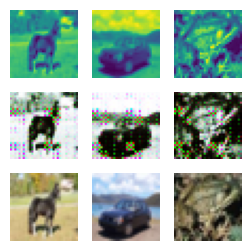

##############
For Epoch:25
Training Discriminator
2/2 [==============================] - 0s 9ms/step
Training Generator
Discriminator Loss:0.1625670687380739
Generator loss:0.3646332061290741
1/1 [==============================] - 0s 17ms/step


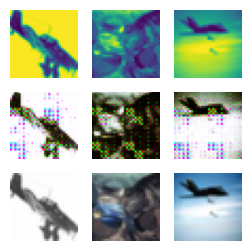

##############
For Epoch:26
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16260474672301428
Generator loss:0.3718132942914963
1/1 [==============================] - 0s 18ms/step


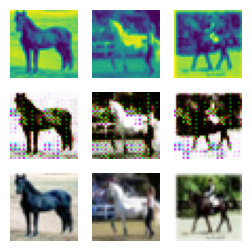

##############
For Epoch:27
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1625674619409591
Generator loss:0.36795530289411543
1/1 [==============================] - 0s 18ms/step


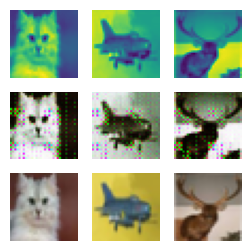

##############
For Epoch:28
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16257753981751705
Generator loss:0.3667561748623848
1/1 [==============================] - 0s 18ms/step


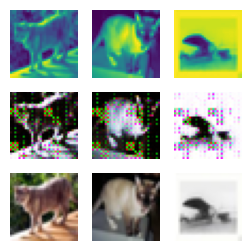

##############
For Epoch:29
Training Discriminator
2/2 [==============================] - 0s 7ms/step
Training Generator
Discriminator Loss:0.16281951392564223
Generator loss:0.38055037796497343
1/1 [==============================] - 0s 17ms/step


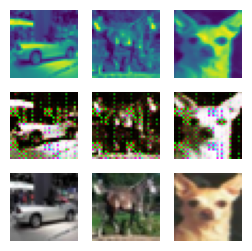

##############
For Epoch:30
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16256619236680933
Generator loss:0.3816228088736534
1/1 [==============================] - 0s 18ms/step


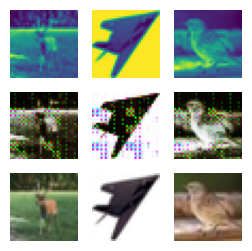

##############
For Epoch:31
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16257230223850969
Generator loss:0.37155801087617873
1/1 [==============================] - 0s 18ms/step


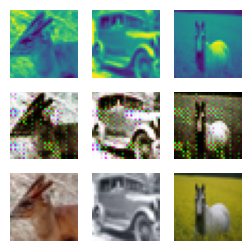

##############
For Epoch:32
Training Discriminator
2/2 [==============================] - 0s 9ms/step
Training Generator
Discriminator Loss:0.1625621994375885
Generator loss:0.3744322127103806
1/1 [==============================] - 0s 17ms/step


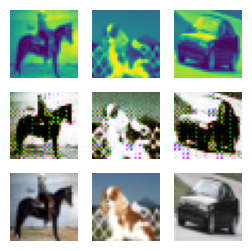

##############
For Epoch:33
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16259556047899537
Generator loss:0.36833895415067675
1/1 [==============================] - 0s 17ms/step


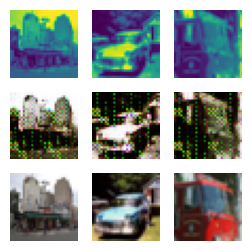

##############
For Epoch:34
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1625720165992098
Generator loss:0.3731637707352638
1/1 [==============================] - 0s 28ms/step


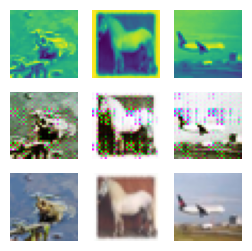

##############
For Epoch:35
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16258247723010583
Generator loss:0.38009357154369355
1/1 [==============================] - 0s 17ms/step


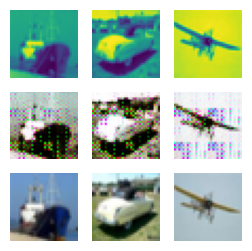

##############
For Epoch:36
Training Discriminator
2/2 [==============================] - 0s 10ms/step
Training Generator
Discriminator Loss:0.16260660284462886
Generator loss:0.39013480812311174
1/1 [==============================] - 0s 18ms/step


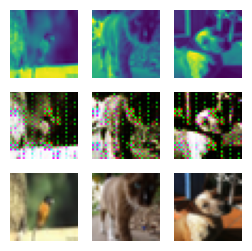

##############
For Epoch:37
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1804305251991905
Generator loss:0.3845610761642456
1/1 [==============================] - 0s 27ms/step


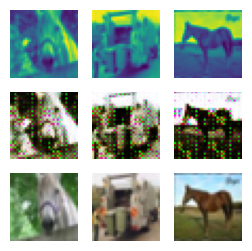

##############
For Epoch:38
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16264798231753047
Generator loss:0.3852286076545715
1/1 [==============================] - 0s 17ms/step


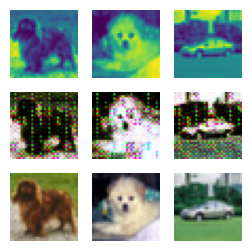

##############
For Epoch:39
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16261433768917755
Generator loss:0.38389675319194794
1/1 [==============================] - 0s 21ms/step


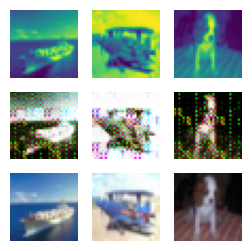

##############
For Epoch:40
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1626426549656105
Generator loss:0.380891480743885
1/1 [==============================] - 0s 19ms/step


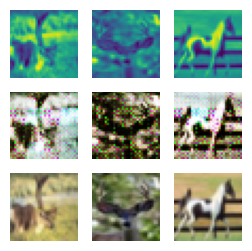

##############
For Epoch:41
Training Discriminator
2/2 [==============================] - 0s 10ms/step
Training Generator
Discriminator Loss:0.16264279618851674
Generator loss:0.37257379174232486
1/1 [==============================] - 0s 18ms/step


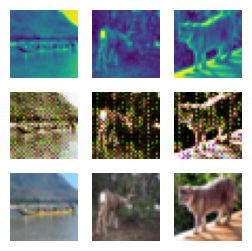

##############
For Epoch:42
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1626798849786519
Generator loss:0.3908551886677742
1/1 [==============================] - 0s 26ms/step


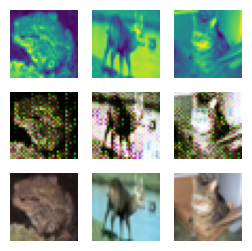

##############
For Epoch:43
Training Discriminator
2/2 [==============================] - 0s 7ms/step
Training Generator
Discriminator Loss:0.16261243009568774
Generator loss:0.384797585606575
1/1 [==============================] - 0s 18ms/step


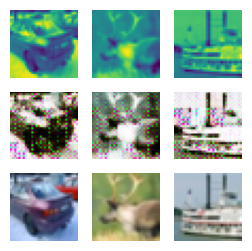

##############
For Epoch:44
Training Discriminator
2/2 [==============================] - 0s 7ms/step
Training Generator
Discriminator Loss:0.1625811871198687
Generator loss:0.3833058226108551
1/1 [==============================] - 0s 18ms/step


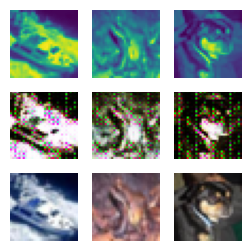

##############
For Epoch:45
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16271991875428454
Generator loss:0.37875825226306914
1/1 [==============================] - 0s 31ms/step


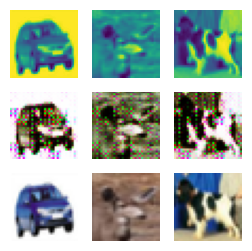

##############
For Epoch:46
Training Discriminator
2/2 [==============================] - 0s 7ms/step
Training Generator
Discriminator Loss:0.1625967513146844
Generator loss:0.38151115119457246
1/1 [==============================] - 0s 17ms/step


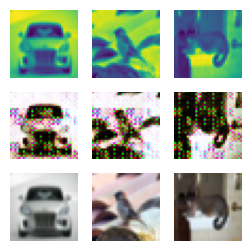

##############
For Epoch:47
Training Discriminator
2/2 [==============================] - 0s 7ms/step
Training Generator
Discriminator Loss:0.16262705373781075
Generator loss:0.3952834245562553
1/1 [==============================] - 0s 18ms/step


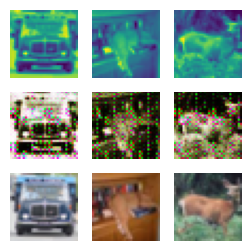

##############
For Epoch:48
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16257680995604346
Generator loss:0.39214315533638
1/1 [==============================] - 0s 19ms/step


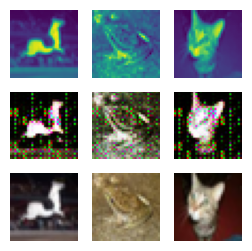

##############
For Epoch:49
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16257565002631566
Generator loss:0.3852796536684036
1/1 [==============================] - 0s 19ms/step


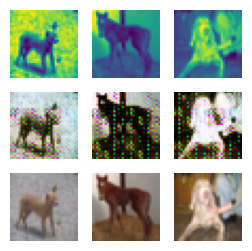

##############
For Epoch:50
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16260515848711066
Generator loss:0.3823862904310226
1/1 [==============================] - 0s 32ms/step


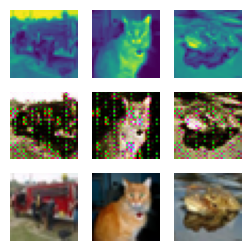

##############
For Epoch:51
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16257227317722084
Generator loss:0.38326159328222276
1/1 [==============================] - 0s 18ms/step


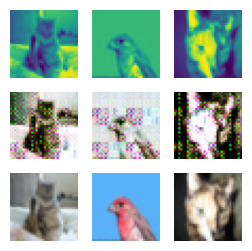

##############
For Epoch:52
Training Discriminator
2/2 [==============================] - 0s 7ms/step
Training Generator
Discriminator Loss:0.16260306884401815
Generator loss:0.3809258410334587
1/1 [==============================] - 0s 18ms/step


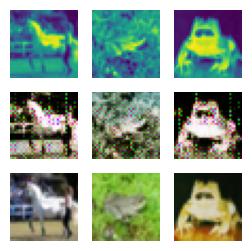

##############
For Epoch:53
Training Discriminator
2/2 [==============================] - 0s 9ms/step
Training Generator
Discriminator Loss:0.16259376524848734
Generator loss:0.37738525569438935
1/1 [==============================] - 0s 18ms/step


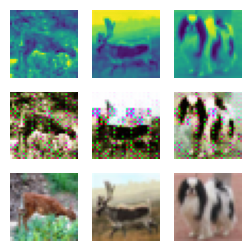

##############
For Epoch:54
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16257253265384378
Generator loss:0.38809041529893873
1/1 [==============================] - 0s 18ms/step


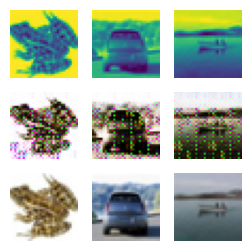

##############
For Epoch:55
Training Discriminator
2/2 [==============================] - 0s 7ms/step
Training Generator
Discriminator Loss:0.16256425406326655
Generator loss:0.4058739176392555
1/1 [==============================] - 0s 19ms/step


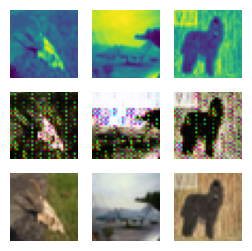

##############
For Epoch:56
Training Discriminator
2/2 [==============================] - 0s 9ms/step
Training Generator
Discriminator Loss:0.16256803678038892
Generator loss:0.4112923458218575
1/1 [==============================] - 0s 18ms/step


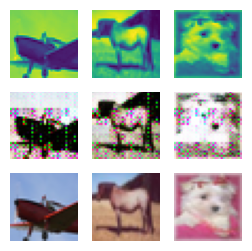

##############
For Epoch:57
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1625692507055055
Generator loss:0.4050957217812538
1/1 [==============================] - 0s 20ms/step


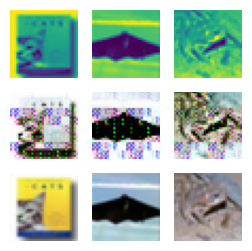

##############
For Epoch:58
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16256716844118174
Generator loss:0.4091095316410065
1/1 [==============================] - 0s 18ms/step


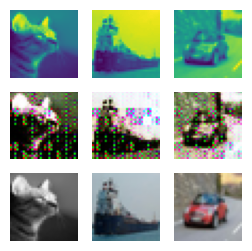

##############
For Epoch:59
Training Discriminator
2/2 [==============================] - 0s 9ms/step
Training Generator
Discriminator Loss:0.1717059207503512
Generator loss:0.4002972060441971
1/1 [==============================] - 0s 45ms/step


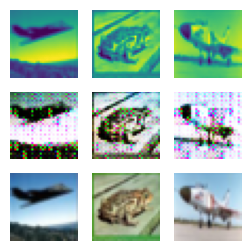

##############
For Epoch:60
Training Discriminator
2/2 [==============================] - 0s 9ms/step
Training Generator
Discriminator Loss:0.16261180837129302
Generator loss:0.4027415281534195
1/1 [==============================] - 0s 30ms/step


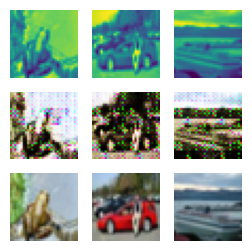

##############
For Epoch:61
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1625983647969366
Generator loss:0.416710821390152
1/1 [==============================] - 0s 25ms/step


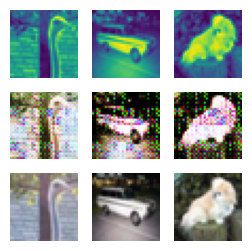

##############
For Epoch:62
Training Discriminator
2/2 [==============================] - 0s 9ms/step
Training Generator
Discriminator Loss:0.16257730203861712
Generator loss:0.4410203287005425
1/1 [==============================] - 0s 25ms/step


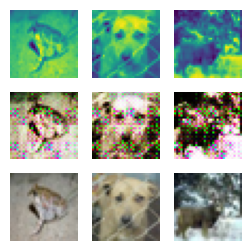

##############
For Epoch:63
Training Discriminator
2/2 [==============================] - 0s 10ms/step
Training Generator
Discriminator Loss:0.16260390864132787
Generator loss:0.4506512549519539
1/1 [==============================] - 0s 27ms/step


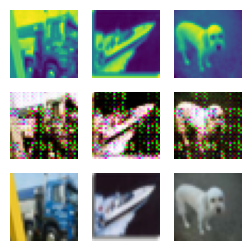

##############
For Epoch:64
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16264062324315576
Generator loss:0.4740578076243401
1/1 [==============================] - 0s 19ms/step


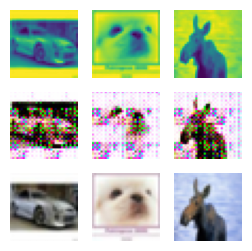

##############
For Epoch:65
Training Discriminator
2/2 [==============================] - 0s 11ms/step
Training Generator
Discriminator Loss:0.16261967108656847
Generator loss:0.48565244048833844
1/1 [==============================] - 0s 26ms/step


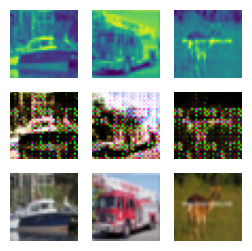

##############
For Epoch:66
Training Discriminator
2/2 [==============================] - 0s 9ms/step
Training Generator
Discriminator Loss:0.1625890015185078
Generator loss:0.4924889674782753
1/1 [==============================] - 0s 29ms/step


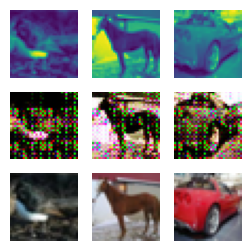

##############
For Epoch:67
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1625912299469516
Generator loss:0.5094713374972344
1/1 [==============================] - 0s 35ms/step


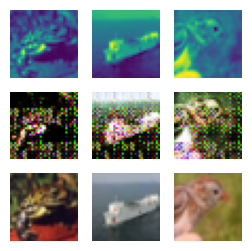

##############
For Epoch:68
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16260615508099135
Generator loss:0.5280313217639923
1/1 [==============================] - 0s 26ms/step


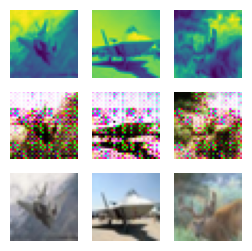

##############
For Epoch:69
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1626059104523341
Generator loss:0.5577482497692108
1/1 [==============================] - 0s 30ms/step


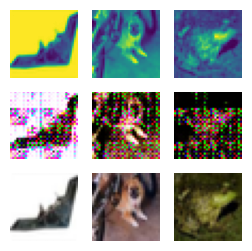

##############
For Epoch:70
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16260003718460553
Generator loss:0.5808302938938141
1/1 [==============================] - 0s 34ms/step


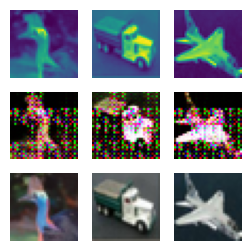

##############
For Epoch:71
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16262520614304662
Generator loss:0.556186671257019
1/1 [==============================] - 0s 25ms/step


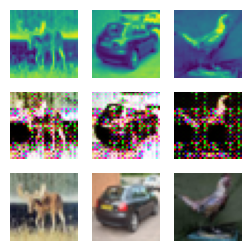

##############
For Epoch:72
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16260532729411267
Generator loss:0.6147408300638199
1/1 [==============================] - 0s 37ms/step


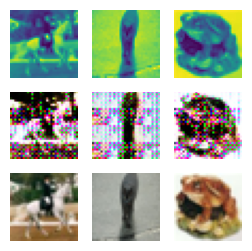

##############
For Epoch:73
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1625717258716418
Generator loss:0.5753727602958679
1/1 [==============================] - 0s 27ms/step


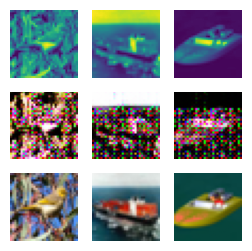

##############
For Epoch:74
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1625589747494756
Generator loss:0.5730048680305481
1/1 [==============================] - 0s 27ms/step


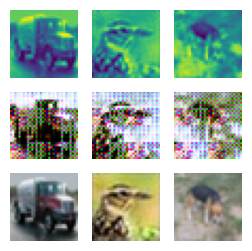

##############
For Epoch:75
Training Discriminator
2/2 [==============================] - 0s 9ms/step
Training Generator
Discriminator Loss:0.17060412482842474
Generator loss:0.35942010253667833
1/1 [==============================] - 0s 25ms/step


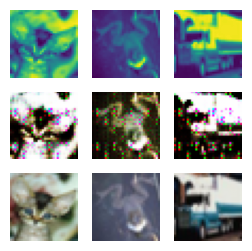

##############
For Epoch:76
Training Discriminator
2/2 [==============================] - 0s 7ms/step
Training Generator
Discriminator Loss:0.16268989346737273
Generator loss:0.34130444228649137
1/1 [==============================] - 0s 29ms/step


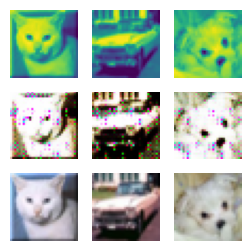

##############
For Epoch:77
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16266868981723065
Generator loss:0.34075408697128295
1/1 [==============================] - 0s 30ms/step


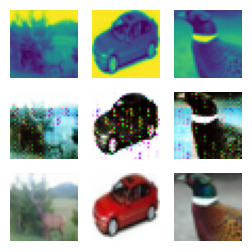

##############
For Epoch:78
Training Discriminator
2/2 [==============================] - 0s 9ms/step
Training Generator
Discriminator Loss:0.16265470168363833
Generator loss:0.34157368272542954
1/1 [==============================] - 0s 25ms/step


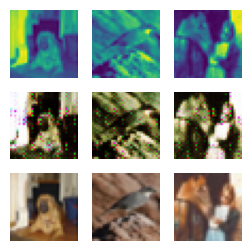

##############
For Epoch:79
Training Discriminator
2/2 [==============================] - 0s 9ms/step
Training Generator
Discriminator Loss:0.16263940602058255
Generator loss:0.3402439311146736
1/1 [==============================] - 0s 34ms/step


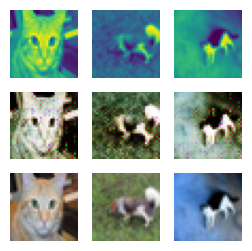

##############
For Epoch:80
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16259703424999827
Generator loss:0.33952591389417647
1/1 [==============================] - 0s 25ms/step


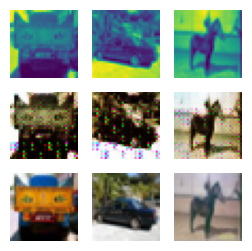

##############
For Epoch:81
Training Discriminator
2/2 [==============================] - 0s 9ms/step
Training Generator
Discriminator Loss:0.16263775173521025
Generator loss:0.34013616740703584
1/1 [==============================] - 0s 26ms/step


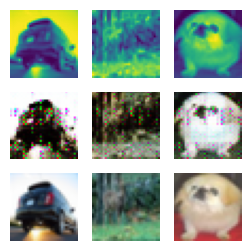

##############
For Epoch:82
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1626884067315092
Generator loss:0.3429141789674759
1/1 [==============================] - 0s 26ms/step


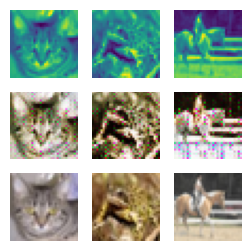

##############
For Epoch:83
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16260885853715934
Generator loss:0.34247103095054626
1/1 [==============================] - 0s 34ms/step


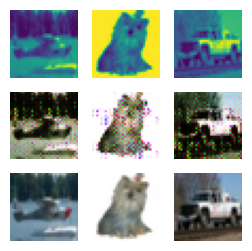

##############
For Epoch:84
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16258988222821075
Generator loss:0.339710992872715
1/1 [==============================] - 0s 52ms/step


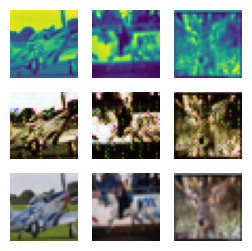

##############
For Epoch:85
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16258667020210396
Generator loss:0.3397432938218117
1/1 [==============================] - 0s 32ms/step


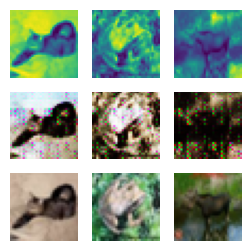

##############
For Epoch:86
Training Discriminator
2/2 [==============================] - 0s 7ms/step
Training Generator
Discriminator Loss:0.1625889963365188
Generator loss:0.3419740757346153
1/1 [==============================] - 0s 25ms/step


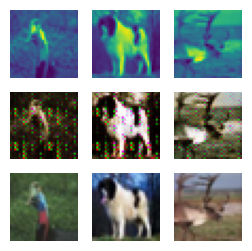

##############
For Epoch:87
Training Discriminator
2/2 [==============================] - 0s 9ms/step
Training Generator
Discriminator Loss:0.16257607819906808
Generator loss:0.34252808690071107
1/1 [==============================] - 0s 29ms/step


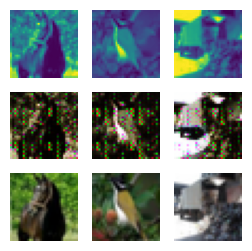

##############
For Epoch:88
Training Discriminator
2/2 [==============================] - 0s 9ms/step
Training Generator
Discriminator Loss:0.16257665488620887
Generator loss:0.3418318873643875
1/1 [==============================] - 0s 29ms/step


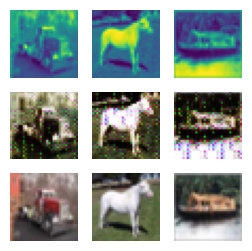

##############
For Epoch:89
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16261439924145862
Generator loss:0.3422689318656921
1/1 [==============================] - 0s 27ms/step


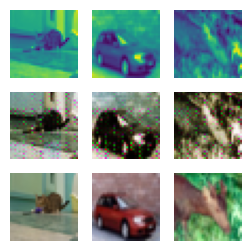

##############
For Epoch:90
Training Discriminator
2/2 [==============================] - 0s 7ms/step
Training Generator
Discriminator Loss:0.1625648321749429
Generator loss:0.34341773867607117
1/1 [==============================] - 0s 26ms/step


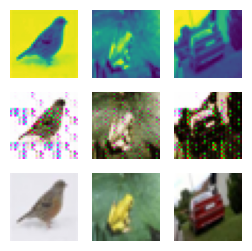

##############
For Epoch:91
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16256131268834878
Generator loss:0.34484390169382095
1/1 [==============================] - 0s 38ms/step


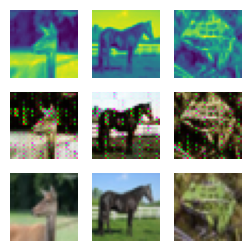

##############
For Epoch:92
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1625736915458586
Generator loss:0.344756321310997
1/1 [==============================] - 0s 27ms/step


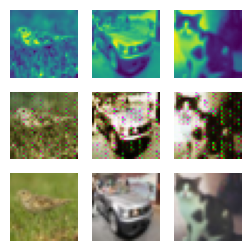

##############
For Epoch:93
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16257229690094563
Generator loss:0.3457338374853134
1/1 [==============================] - 0s 26ms/step


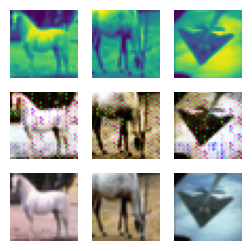

##############
For Epoch:94
Training Discriminator
2/2 [==============================] - 0s 7ms/step
Training Generator
Discriminator Loss:0.16257524851153277
Generator loss:0.34784883111715315
1/1 [==============================] - 0s 25ms/step


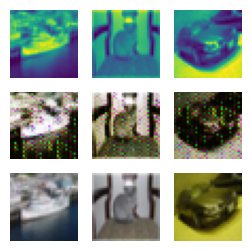

##############
For Epoch:95
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1625618985824454
Generator loss:0.34786702066659925
1/1 [==============================] - 0s 27ms/step


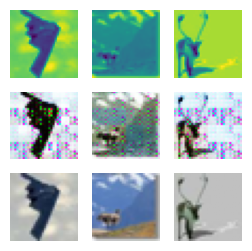

##############
For Epoch:96
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.1625747636382519
Generator loss:0.3499749380350113
1/1 [==============================] - 0s 26ms/step


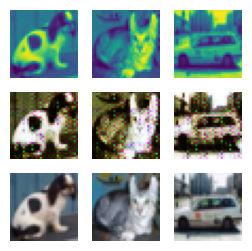

##############
For Epoch:97
Training Discriminator
2/2 [==============================] - 0s 8ms/step
Training Generator
Discriminator Loss:0.16256132627335745
Generator loss:0.3494228395819664
1/1 [==============================] - 0s 46ms/step


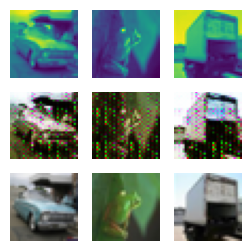

##############
For Epoch:98
Training Discriminator
2/2 [==============================] - 0s 7ms/step
Training Generator
Discriminator Loss:0.16256479344726243
Generator loss:0.3619999125599861
1/1 [==============================] - 0s 34ms/step


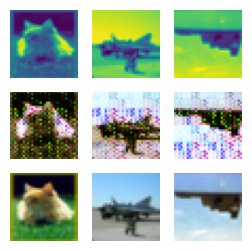

##############
For Epoch:99
Training Discriminator
2/2 [==============================] - 0s 10ms/step
Training Generator
Discriminator Loss:0.16614536815005365
Generator loss:0.36075367003679276
1/1 [==============================] - 0s 26ms/step


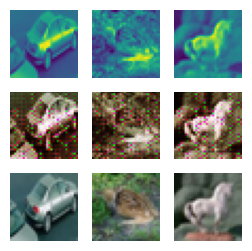

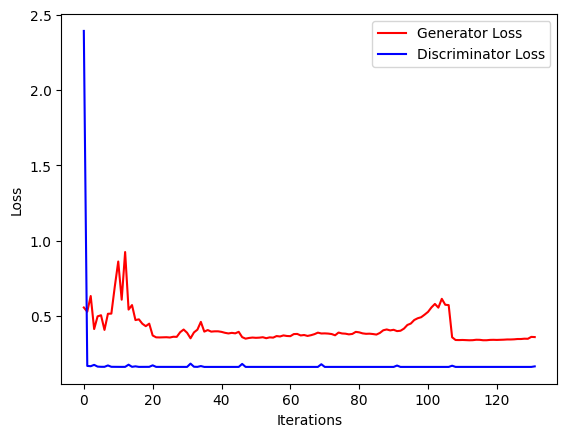

In [ ]:
adams = legacy_Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)

dis.compile(loss="binary_crossentropy", optimizer=adams)
combined.compile(loss="binary_crossentropy", optimizer=adams)

adams.build(combined.trainable_variables)
adams.build(dis.trainable_variables)

adams.build(combined.trainable_variables + dis.trainable_variables)

for epoch in range(epochs):
  print("##############")
  print("For Epoch:"+str(epoch))

  g_loss = 0
  d_loss = 0

  print("Training Discriminator")

  i = shuffle(range(n_example))

  dis.trainable = True
  dis.compile(loss = "binary_crossentropy",optimizer = adams)

  for j in range(dis_updates):

    for b in range(batches):

      x_batch = x[i[b*batch_size:(b+1)*batch_size]]
      y_batch = y[i[b*batch_size:(b+1)*batch_size]]

      pre_batch = gen.predict(x_batch)

      d_loss += dis.train_on_batch([x_batch,y_batch],one)
      d_loss += dis.train_on_batch([x_batch,pre_batch],zero)

  print("Training Generator")

  dis.trainable = False
  combined.compile(loss  = "binary_crossentropy", optimizer = adams)
  dis.compile(loss = "binary_crossentropy",optimizer = adams)

  for  j in range(gen_updates):

    for b in range(batches):

      x_batch = x[i[b*batch_size:(b+1)*batch_size]]
      y_batch = y[i[b*batch_size:(b+1)*batch_size]]

      gl,_,_ = combined.train_on_batch([x_batch,y_batch],[zero,one])
      g_loss += gl

  g_loss /= g_loss_factor
  d_loss /= d_loss_factor

  print("Discriminator Loss:"+str(d_loss))
  print("Generator loss:"+str(g_loss))

  genLoss.append(g_loss)
  disLoss.append(d_loss)

  gen.save_weights("gdrive/My Drive/newGAN/Generator.h5")
  dis.save_weights("gdrive/My Drive/newGAN/Discriminator.h5")

  plt_indices = np.random.randint(50000,size=3)
  plt_a = x[plt_indices]
  plt_b = gen.predict(plt_a)
  plt_b = (plt_b+1)/2
  plt_c = (y[plt_indices]+1)/2
  fig = plot(plt_a,plt_b,plt_c,3)
  plt.show()
  plt.close(fig)

plt.plot(genLoss, c='r', label="Generator Loss")
plt.plot(disLoss, c='b', label="Discriminator Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()


##**Loss Curve**

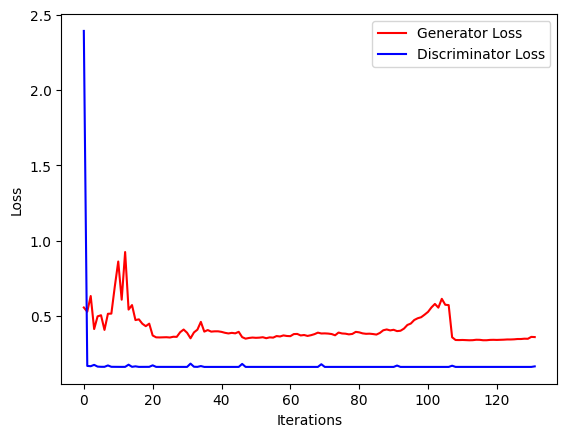

In [ ]:
plt.plot(genLoss, c='r', label="Generator Loss")
plt.plot(disLoss, c='b', label="Discriminator Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()
